In [3]:
import pandas as pd
import numpy as np

# Load the dataset
# Make sure to update the path to the location of your dataset.
file_path = '/content/p1_movie_metadata.csv'
movie_data = pd.read_csv(file_path)

# Displaying basic information about the dataset to understand structure and identify columns with missing data
print("Initial Dataset Information:")
print(movie_data.info())

# Calculating the number of missing values in each column to prioritize data cleaning efforts
missing_values = movie_data.isnull().sum()
print("\nMissing values in each column:\n", missing_values)

# Handling missing values for numerical columns:
# We choose median imputation for numerical data because it is less sensitive to outliers than the mean.
numerical_columns = ['num_critic_for_reviews', 'duration', 'gross', 'budget', 'title_year', 'actor_1_facebook_likes', 'actor_2_facebook_likes', 'actor_3_facebook_likes']

for column in numerical_columns:
    # Checking if the current column has missing values
    if movie_data[column].isnull().any():
        # Calculating the median of the column
        median = movie_data[column].median()
        # Imputing missing values with the median
        movie_data[column].fillna(median, inplace=True)
        print(f"Filled missing values in {column} with median value {median}.")

# After imputation, it's a good practice to check if any numerical columns still contain missing values.
print("\nMissing values after imputation in numerical columns:\n", movie_data[numerical_columns].isnull().sum())

# For critical categorical data like 'director_name', if missing values still exist, dropping those rows might be necessary.
# This decision depends on the importance of complete records for your analysis or model training.
if 'director_name' in movie_data.columns:
    initial_count = len(movie_data)
    movie_data.dropna(subset=['director_name'], inplace=True)
    final_count = len(movie_data)
    print(f"Dropped {initial_count - final_count} rows due to missing 'director_name'.")

# Displaying the head of the dataset to confirm the changes and ensure the data is ready for the next steps.
print("\nPreview of dataset after handling missing values:")
print(movie_data.head())

# Save the cleaned data to a new CSV file
output_path = '/content/preprocessed_data.csv'
movie_data.to_csv(output_path, index=False)
print(f"Data saved as {output_path}.")


Initial Dataset Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5043 entries, 0 to 5042
Data columns (total 28 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   color                      5024 non-null   object 
 1   director_name              4939 non-null   object 
 2   num_critic_for_reviews     4993 non-null   float64
 3   duration                   5028 non-null   float64
 4   director_facebook_likes    4939 non-null   float64
 5   actor_3_facebook_likes     5020 non-null   float64
 6   actor_2_name               5030 non-null   object 
 7   actor_1_facebook_likes     5036 non-null   float64
 8   gross                      4159 non-null   float64
 9   genres                     5043 non-null   object 
 10  actor_1_name               5036 non-null   object 
 11  movie_title                5043 non-null   object 
 12  num_voted_users            5043 non-null   int64  
 13  cast_total_facebook

In [4]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import PolynomialFeatures
from sklearn.feature_extraction.text import TfidfVectorizer

# Assuming 'movie_data' is already loaded and preprocessed from Step 1
file_path = '/content/p1_movie_metadata.csv'  # Update the path accordingly
movie_data = pd.read_csv(file_path)

# Prepare for feature engineering
# Ensure there are no NaN values in 'title_year' before creating temporal features
movie_data['title_year'].fillna(movie_data['title_year'].median(), inplace=True)
movie_data['decade'] = (movie_data['title_year'] // 10 * 10).astype(int)
movie_data['year_mod_4'] = movie_data['title_year'] % 4

# Interaction Features: Creating interaction terms for significant numerical predictors
selected_features = movie_data[['budget', 'director_facebook_likes', 'num_critic_for_reviews']]
selected_features = np.log1p(selected_features)  # Log transformation to reduce skewness and scale the features

poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
interacted_features = poly.fit_transform(selected_features.fillna(0))
interacted_features_df = pd.DataFrame(interacted_features, columns=poly.get_feature_names_out(selected_features.columns))
movie_data = pd.concat([movie_data, interacted_features_df], axis=1)

# Text Features: Advanced text processing of 'movie_title' using TF-IDF
if 'movie_title' in movie_data.columns:
    tfidf_vectorizer = TfidfVectorizer(min_df=5, max_features=100)  # Adjust max_features to control dimensionality
    title_features = tfidf_vectorizer.fit_transform(movie_data['movie_title'].fillna(''))
    title_features_df = pd.DataFrame(title_features.toarray(), columns=tfidf_vectorizer.get_feature_names_out())
    movie_data = pd.concat([movie_data.reset_index(drop=True), title_features_df.reset_index(drop=True)], axis=1)

# Display the dataset to confirm the integration of new features
print("Dataset with newly engineered features:")
print(movie_data.head())

# Optionally, save the dataset with new features for further analysis or model building
movie_data.to_csv('/content/feature_engineered_movie_data.csv', index=False)


Dataset with newly engineered features:
   color      director_name  num_critic_for_reviews  duration  \
0  Color      James Cameron                   723.0     178.0   
1  Color     Gore Verbinski                   302.0     169.0   
2  Color         Sam Mendes                   602.0     148.0   
3  Color  Christopher Nolan                   813.0     164.0   
4    NaN        Doug Walker                     NaN       NaN   

   director_facebook_likes  actor_3_facebook_likes      actor_2_name  \
0                      0.0                   855.0  Joel David Moore   
1                    563.0                  1000.0     Orlando Bloom   
2                      0.0                   161.0      Rory Kinnear   
3                  22000.0                 23000.0    Christian Bale   
4                    131.0                     NaN        Rob Walker   

   actor_1_facebook_likes        gross                           genres  ...  \
0                  1000.0  760505847.0  Action|Adventure

Initial Dataset Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5043 entries, 0 to 5042
Columns: 136 entries, color to your
dtypes: float64(120), int64(4), object(12)
memory usage: 5.2+ MB
None

Statistical Summary of Numerical Columns:
       num_critic_for_reviews     duration  director_facebook_likes  \
count             4993.000000  5028.000000              4939.000000   
mean               140.194272   107.201074               686.509212   
std                121.601675    25.197441              2813.328607   
min                  1.000000     7.000000                 0.000000   
25%                 50.000000    93.000000                 7.000000   
50%                110.000000   103.000000                49.000000   
75%                195.000000   118.000000               194.500000   
max                813.000000   511.000000             23000.000000   

       actor_3_facebook_likes  actor_1_facebook_likes         gross  \
count             5020.000000        

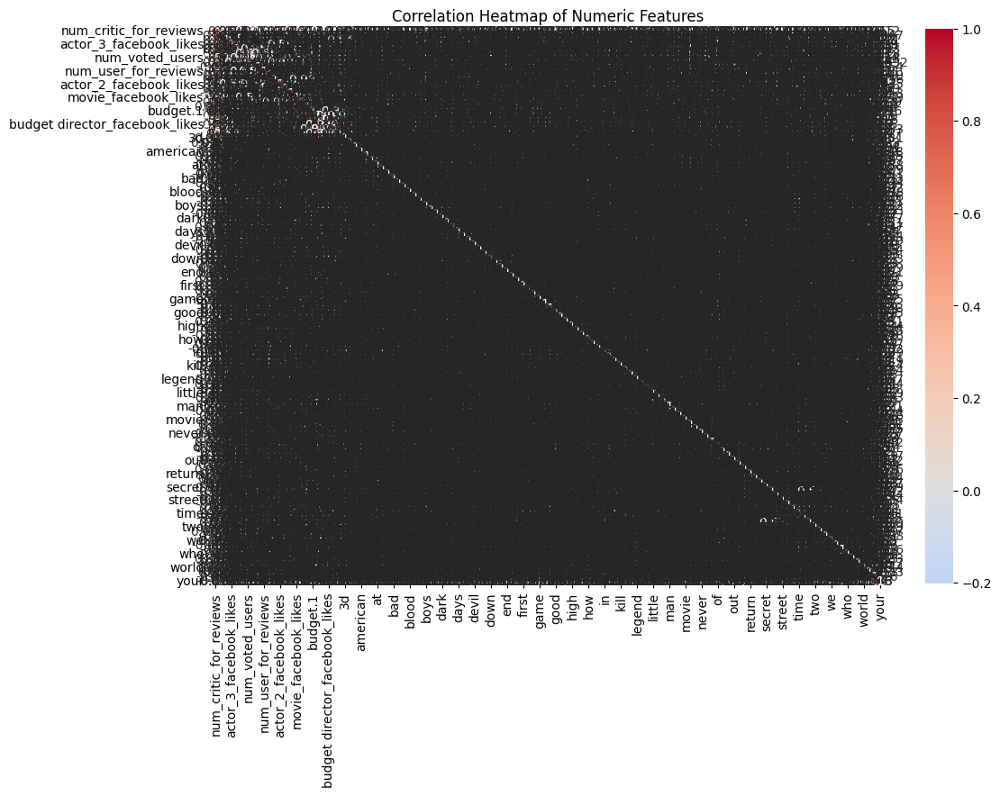

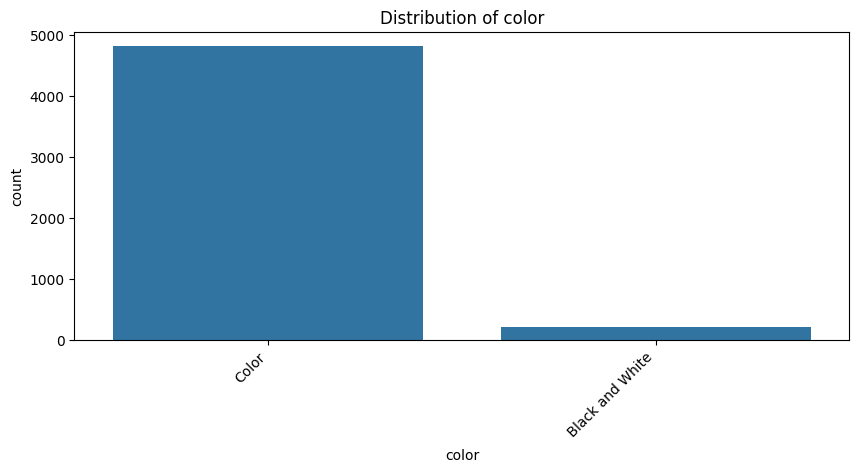

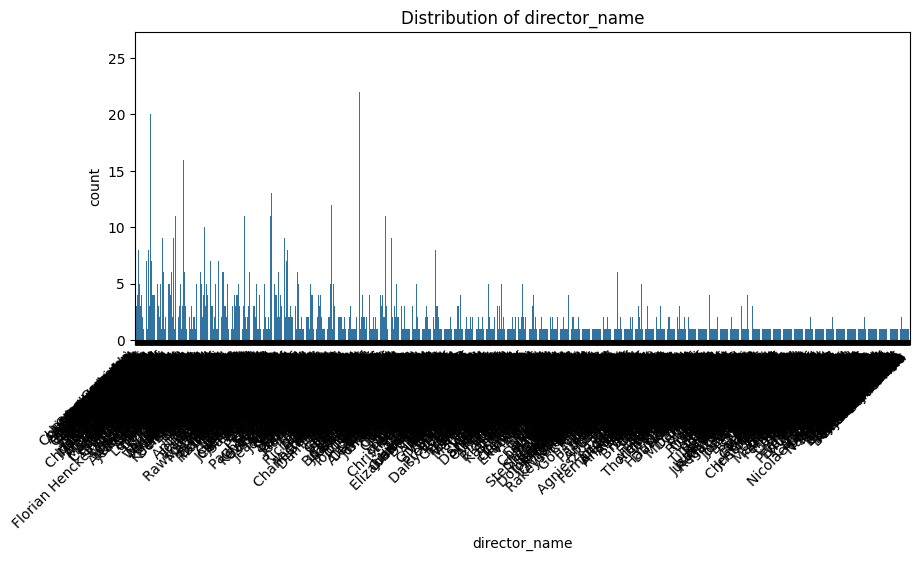

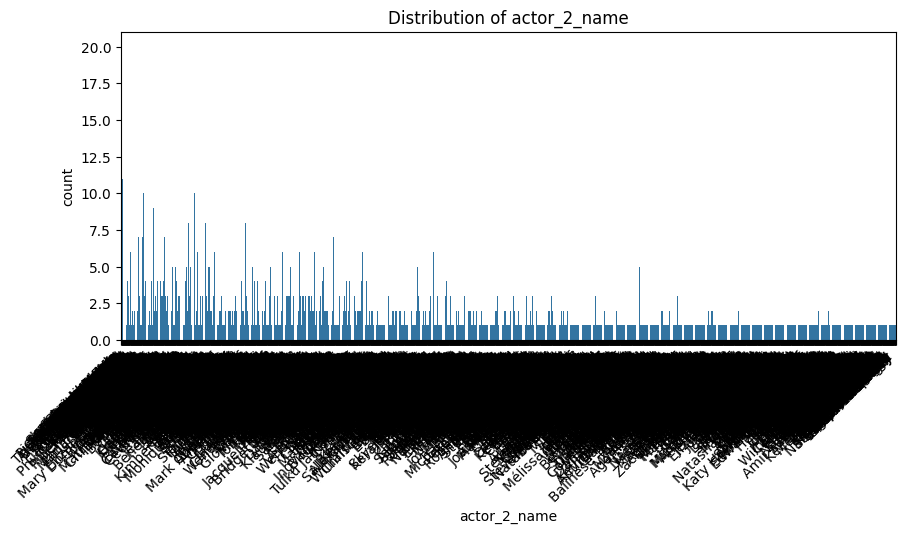

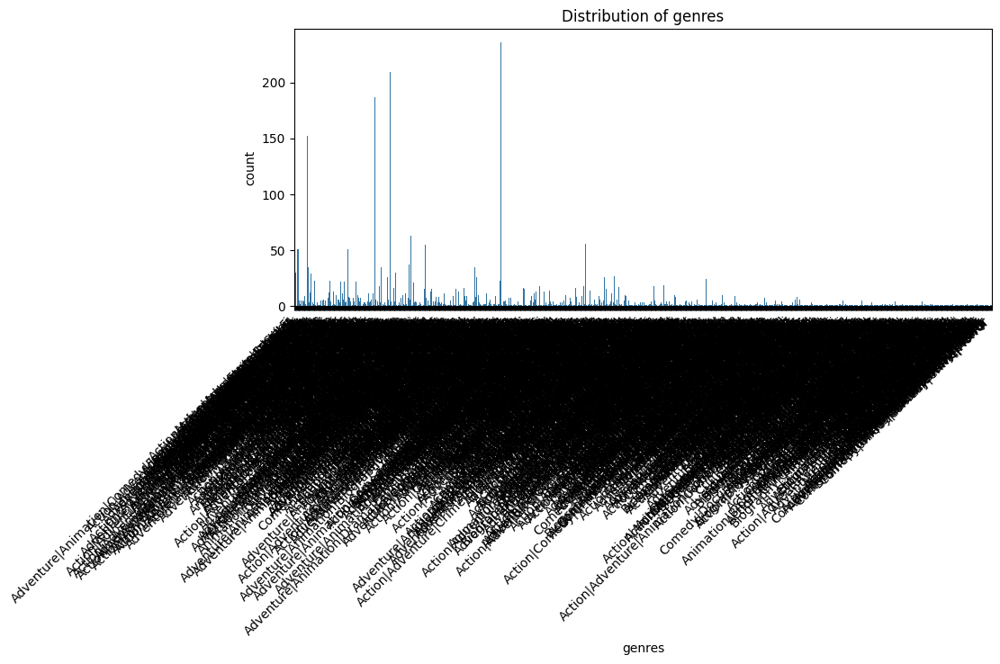

...

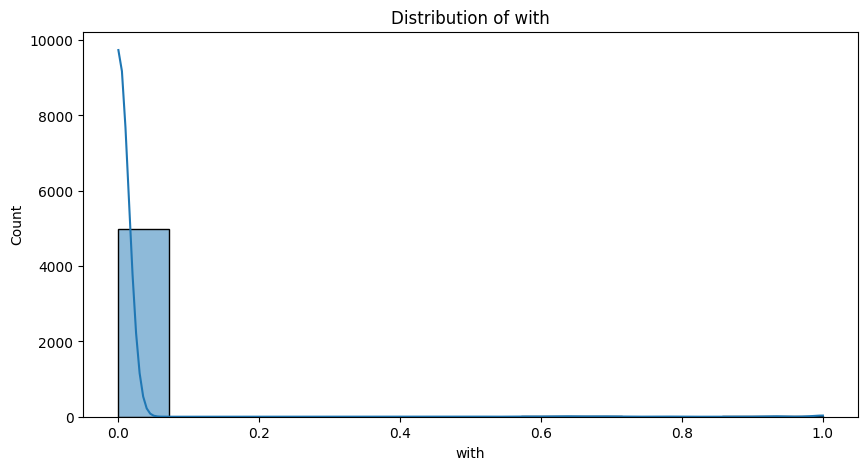

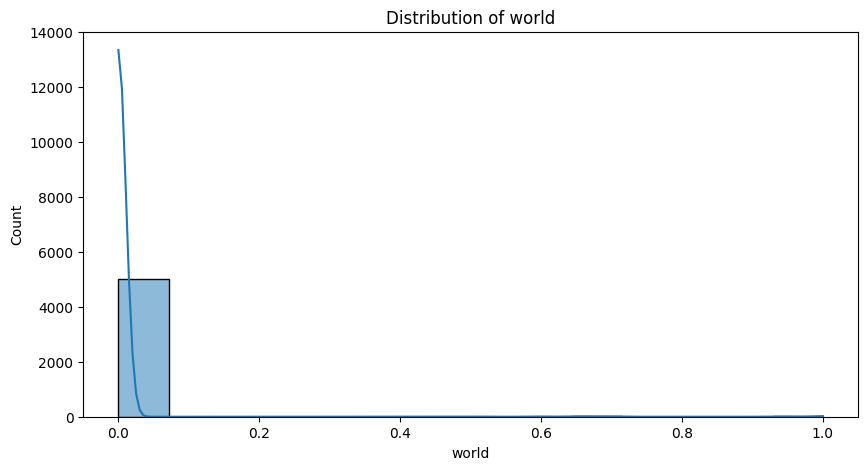

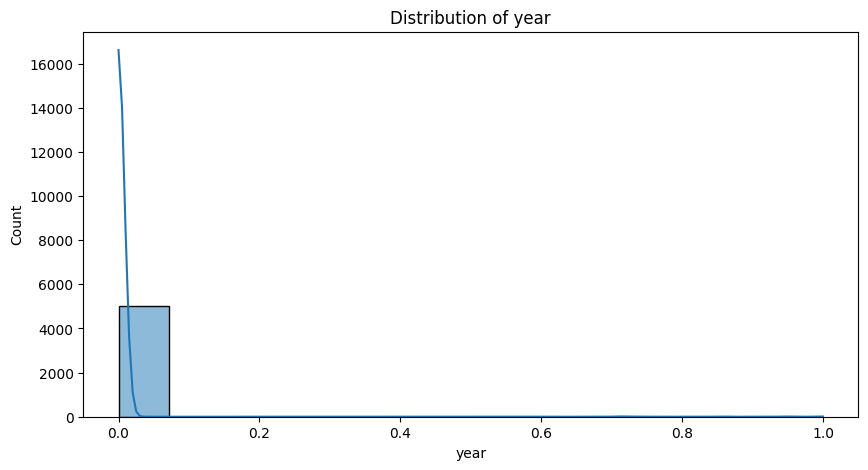

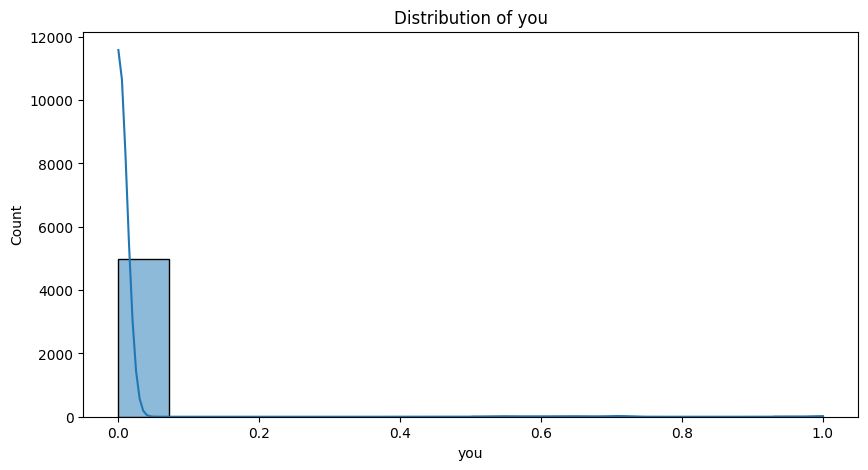

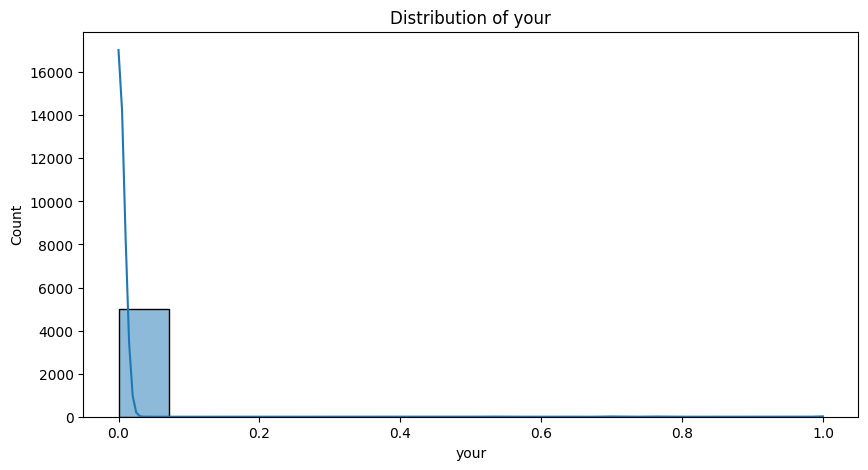

In [6]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Load the dataset
file_path = '/content/feature_engineered_movie_data.csv'  # Make sure the path is correct
movie_data = pd.read_csv(file_path)

# Display basic information about the dataset
print("Initial Dataset Information:")
print(movie_data.info())

# Display statistical summary for numerical columns
print("\nStatistical Summary of Numerical Columns:")
print(movie_data.describe(include=[np.number]))

# Display statistical summary for categorical columns
print("\nStatistical Summary of Categorical Columns:")
print(movie_data.describe(include=['object', 'category']))

# Correlation Heatmap for Numeric Data Only
numeric_data = movie_data.select_dtypes(include=[np.number])
plt.figure(figsize=(12, 8))
correlation_matrix = numeric_data.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation Heatmap of Numeric Features')
plt.show()

# Visualizing Categorical Data: Count plot for each categorical variable
categorical_columns = movie_data.select_dtypes(include=['object', 'category']).columns
for column in categorical_columns:
    plt.figure(figsize=(10, 4))
    sns.countplot(data=movie_data, x=column)
    plt.title(f'Distribution of {column}')
    plt.xticks(rotation=45, ha='right')
    plt.show()

# Scatter Plots for Relationships between Numerical Features
target_column = 'imdb_score'  # Assuming this is a key target variable
for column in numeric_data.columns:
    plt.figure(figsize=(10, 5))
    sns.scatterplot(data=movie_data, x=column, y=target_column)
    plt.title(f'Scatter Plot of {column} vs. {target_column}')
    plt.show()

# Histograms for Numeric Features
for column in numeric_data.columns:
    plt.figure(figsize=(10, 5))
    sns.histplot(data=movie_data, x=column, kde=True)
    plt.title(f'Distribution of {column}')
    plt.show()


In [9]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler

# Load the dataset
file_path = '/content/feature_engineered_movie_data.csv'
movie_data = pd.read_csv(file_path)

# Prepare the dataset
# Select only numeric features for PCA and RFE
numeric_data = movie_data.select_dtypes(include=[np.number])

# Handle missing values using SimpleImputer
imputer = SimpleImputer(strategy='median')
imputed_data = imputer.fit_transform(numeric_data)

# Standardize the features
scaler = StandardScaler()
scaled_data = scaler.fit_transform(imputed_data)

# Apply PCA for Dimensionality Reduction
pca = PCA(n_components=10)  # Select number of principal components
principal_components = pca.fit_transform(scaled_data)

# Display the amount of variance explained by each principal component
print("Explained variance by principal components:")
print(pca.explained_variance_ratio_)

# Recursive Feature Elimination (RFE) for Feature Selection
# Using Linear Regression as the base model for RFE
linreg = LinearRegression()
rfe = RFE(linreg, n_features_to_select=10)  # Select top 10 features
rfe.fit(scaled_data, movie_data['imdb_score'])  # Assuming imdb_score is the target

# Get the selected features
selected_features = numeric_data.columns[rfe.support_]
print("Selected features by RFE:")
print(selected_features)

# Save the dataset with selected features from RFE
rfe_selected_data = numeric_data[selected_features]
rfe_selected_data.to_csv('/content/rfe_selected_features.csv', index=False)
print("RFE selected features saved to /content/rfe_selected_features.csv")


Explained variance by principal components:
[0.05067012 0.02255573 0.01810856 0.0168965  0.0130727  0.01262826
 0.01108832 0.01018457 0.01001391 0.00982025]
Selected features by RFE:
Index(['duration', 'imdb_score', 'decade', 'is', 'man', 'new', 'part', 'we',
       'what', 'who'],
      dtype='object')
RFE selected features saved to /content/rfe_selected_features.csv


In [11]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import VotingRegressor, StackingRegressor
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

# Load the dataset
file_path = '/content/rfe_selected_features.csv'
data = pd.read_csv(file_path)

# Assume the target variable for regression is 'imdb_score'
target = 'imdb_score'
X = data.drop(target, axis=1)
y = data[target]

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Create a preprocessing pipeline to handle missing values and scale the data
preprocessing_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

# Preprocess the training and testing sets
X_train_preprocessed = preprocessing_pipeline.fit_transform(X_train)
X_test_preprocessed = preprocessing_pipeline.transform(X_test)

# Model Building
linear_model = LinearRegression()
rf_model = RandomForestRegressor(random_state=42)
gb_model = GradientBoostingRegressor(random_state=42)

# Fit the models using preprocessed data
linear_model.fit(X_train_preprocessed, y_train)
rf_model.fit(X_train_preprocessed, y_train)
gb_model.fit(X_train_preprocessed, y_train)

# Ensembling: Stacking and Voting
stacking_regressor = StackingRegressor(
    estimators=[
        ('lr', linear_model),
        ('rf', rf_model),
        ('gb', gb_model)
    ],
    final_estimator=LinearRegression()
)
stacking_regressor.fit(X_train_preprocessed, y_train)

voting_regressor = VotingRegressor(estimators=[
    ('lr', linear_model),
    ('rf', rf_model),
    ('gb', gb_model)
])
voting_regressor.fit(X_train_preprocessed, y_train)

# Evaluate the models
models = {
    "Linear Regression": linear_model,
    "Random Forest": rf_model,
    "Gradient Boosting": gb_model,
    "Stacking Regressor": stacking_regressor,
    "Voting Regressor": voting_regressor
}

for name, model in models.items():
    scores = cross_val_score(model, X_train_preprocessed, y_train, cv=5, scoring='neg_mean_absolute_error')
    print(f"{name} Mean Absolute Error: {-np.mean(scores)}")

# Test on the holdout set
for name, model in models.items():
    y_pred = model.predict(X_test_preprocessed)
    test_score = np.mean(np.abs(y_pred - y_test))
    print(f"{name} Test Set Mean Absolute Error: {test_score}")


Linear Regression Mean Absolute Error: 0.8207978366147382
Random Forest Mean Absolute Error: 0.8240611347532975
Gradient Boosting Mean Absolute Error: 0.7841891835983955
Stacking Regressor Mean Absolute Error: 0.7847836857727511
Voting Regressor Mean Absolute Error: 0.7912535651700361
Linear Regression Test Set Mean Absolute Error: 0.8220436755904863
Random Forest Test Set Mean Absolute Error: 0.8110423062892231
Gradient Boosting Test Set Mean Absolute Error: 0.7841700394294213
Stacking Regressor Test Set Mean Absolute Error: 0.7826826218214167
Voting Regressor Test Set Mean Absolute Error: 0.785959054140964


Fitting 3 folds for each of 108 candidates, totalling 324 fits
Best parameters found by Grid Search: {'max_depth': 10, 'max_features': 'sqrt', 'min_samples_split': 10, 'n_estimators': 200}
Best cross-validation score (MAE): 0.7813215946800756
Test Set Mean Absolute Error for Optimized Random Forest: 0.7822201876756617
Feature Importances:
 duration    0.779057
decade      0.177407
man         0.013084
is          0.010399
part        0.006433
new         0.003869
what        0.003544
we          0.003243
who         0.002962
dtype: float64


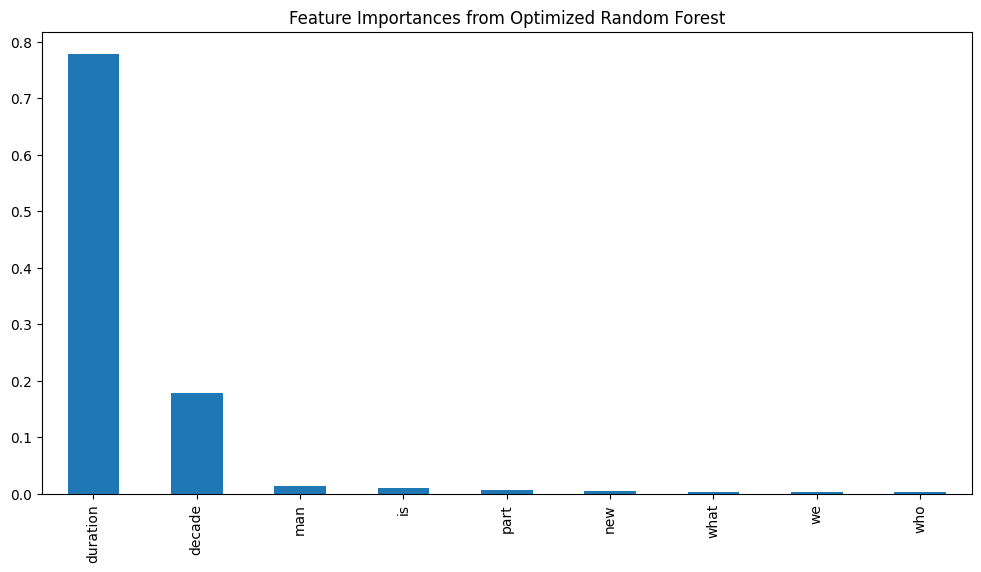

In [12]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

# Load the dataset
file_path = '/content/rfe_selected_features.csv'
data = pd.read_csv(file_path)

# Assume the target variable for regression is 'imdb_score'
target = 'imdb_score'
X = data.drop(target, axis=1)
y = data[target]

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Create a preprocessing pipeline to handle missing values and scale the data
preprocessing_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

# Preprocess the training and testing sets
X_train_preprocessed = preprocessing_pipeline.fit_transform(X_train)
X_test_preprocessed = preprocessing_pipeline.transform(X_test)

# Hyperparameter Tuning with Grid Search
# Tuning RandomForestRegressor as an example
rf = RandomForestRegressor(random_state=42)
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth': [10, 20, 30, None],
    'min_samples_split': [2, 5, 10]
}
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2, scoring='neg_mean_absolute_error')
grid_search.fit(X_train_preprocessed, y_train)

# Best parameters and score
print("Best parameters found by Grid Search:", grid_search.best_params_)
print("Best cross-validation score (MAE):", -grid_search.best_score_)

# Evaluating the best model on the test set
best_rf_model = grid_search.best_estimator_
y_pred = best_rf_model.predict(X_test_preprocessed)
test_mae = mean_absolute_error(y_test, y_pred)
print("Test Set Mean Absolute Error for Optimized Random Forest:", test_mae)

# Feature Importance Analysis
feature_importances = pd.Series(best_rf_model.feature_importances_, index=X.columns)
feature_importances = feature_importances.sort_values(ascending=False)
print("Feature Importances:\n", feature_importances)

# Plotting feature importances
feature_importances.plot(kind='bar', figsize=(12, 6))
plt.title("Feature Importances from Optimized Random Forest")
plt.show()


In [16]:
import pandas as pd
import numpy as np
from sklearn.model_selection import cross_val_score, KFold, train_test_split
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

# Load the dataset
file_path = '/content/rfe_selected_features.csv'
data = pd.read_csv(file_path)

# Assume the target variable for regression is 'imdb_score'
target = 'imdb_score'
X = data.drop(target, axis=1)
y = data[target]

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Preprocessing pipeline for handling missing values and scaling
preprocessing_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

X_train_preprocessed = preprocessing_pipeline.fit_transform(X_train)
X_test_preprocessed = preprocessing_pipeline.transform(X_test)

# Reuse the best model
best_rf_model = RandomForestRegressor(
    n_estimators=grid_search.best_params_['n_estimators'],
    max_features=grid_search.best_params_['max_features'],
    max_depth=grid_search.best_params_['max_depth'],
    min_samples_split=grid_search.best_params_['min_samples_split'],
    random_state=42
)

# Cross-validation using k-fold
kfold = KFold(n_splits=5, shuffle=True, random_state=42)
cv_scores = cross_val_score(best_rf_model, X_train_preprocessed, y_train, cv=kfold, scoring='neg_mean_absolute_error')
print(f"Cross-validated Mean Absolute Error: {-np.mean(cv_scores)}")

# Fit the model on training data and predict on test data
best_rf_model.fit(X_train_preprocessed, y_train)
y_pred = best_rf_model.predict(X_test_preprocessed)

# Evaluate using MAE and R²
test_mae = mean_absolute_error(y_test, y_pred)
test_r2 = r2_score(y_test, y_pred)
print(f"Test Set Mean Absolute Error: {test_mae}")
print(f"Test Set R² Score: {test_r2}")

# Additional metric: Mean Squared Error (optional)
test_mse = mean_squared_error(y_test, y_pred)
print(f"Test Set Mean Squared Error: {test_mse}")


Cross-validated Mean Absolute Error: 0.7821442539388458
Test Set Mean Absolute Error: 0.7822201876756617
Test Set R² Score: 0.17795863048240468
Test Set Mean Squared Error: 1.0643932415538464
